# 5.- Feature Engineering

Process of transforming raw data into features that better represent the underlying problem to the predictive models, resulting in improved model accuracy on unseen data.

In [2]:
#correlations of the data 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#pca
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#backwards elimination with python statsmodels.api
import pandas as pd
import statsmodels.api as sm


In [3]:
### Correlation heat map
df  = pd.read_csv('datasets/data_cleaned_for_eda.csv',  sep=",",low_memory=False)

df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17464 entries, 0 to 17463
Data columns (total 110 columns):
 #    Column                  Dtype  
---   ------                  -----  
 0    Unnamed: 0              int64  
 1    Time                    int64  
 2    LocID                   int64  
 3    SortOrder               int64  
 4    Notes                   float64
 5    ISO3_code               object 
 6    ISO2_code               object 
 7    SDMX_code               float64
 8    LocTypeID               int64  
 9    LocTypeName             object 
 10   ParentID                int64  
 11   Location                object 
 12   VarID                   int64  
 13   Variant                 object 
 14   TPopulation1Jan         float64
 15   TPopulation1July        float64
 16   TPopulationMale1July    float64
 17   TPopulationFemale1July  float64
 18   PopDensity              float64
 19   PopSexRatio             float64
 20   MedianAgePop            float64
 21   NatChange 

## Attribute reduction algorithms

# PCA

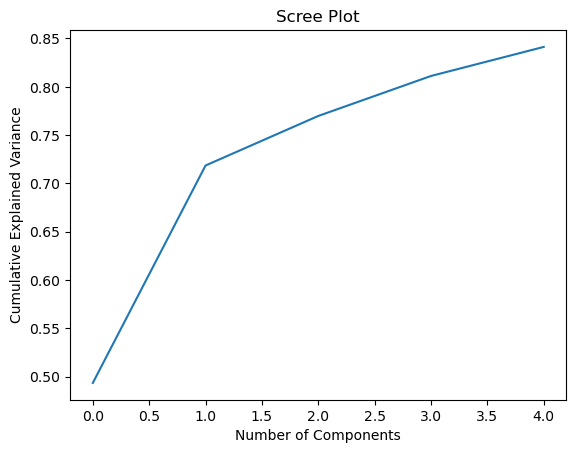

In [5]:
#exploratory data analytics with PCS 

pd.set_option('mode.chained_assignment', None)

# Identify the numerical columns in your dataframe
#numerical_columns = df.select_dtypes(include=[np.number]).columns

#including only those attributes that have some significance, related to variable values extracted from the population
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
numerical_data = df[numerical_columns]

numerical_data.fillna(0, inplace=True)

# Standardize the features by subtracting the mean and scaling to unit variance
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numerical_data)


# Create a PCA object and specify the number of components you want to keep
pca = PCA(n_components=5)  

# Apply PCA to the standardized data
pca_result = pca.fit_transform(data_scaled)


# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.cumsum(explained_variance_ratio))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()



PCA Rule of Thumb for Scree Plot 

https://bioturing.medium.com/how-to-read-pca-biplots-and-scree-plots-186246aae063

## print variance ratio and cumulative variance ratio

In [8]:
# Print the explained variance ratio
print("Explained variance ratio:", explained_variance_ratio)

# Print the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
print("Cumulative explained variance ratio:", cumulative_variance_ratio)

Explained variance ratio: [0.49358737 0.22498059 0.05126143 0.04137957 0.03005749]
Cumulative explained variance ratio: [0.49358737 0.71856796 0.76982939 0.81120896 0.84126645]


### Backwards elimination algorithm

The purpose of feature elimination is to reduce the dimensionality of the dataset and improve the performance, interpretability, and efficiency of machine learning models.

In [9]:
# Assuming you have your dataset stored in a pandas DataFrame called 'data'
# 'data' should have the shape (17000, 21), with 21 attributes and 17000 records

#including only those attributes that have some significance, related to variable values extracted from the population
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
numerical_data = df[numerical_columns]

# Add a constant column to the DataFrame
data = sm.add_constant(numerical_data)

# Create a list of all attribute names
all_features = data.columns.tolist()

# Set the significance level for removing features (e.g., p-value threshold)
significance_level = 0.5

while len(all_features) > 1:
    # Select the remaining features for the current iteration
    remaining_features = all_features[:]
    
    # Fit the model using statsmodels
    model = sm.OLS(data.iloc[:, 0], data[remaining_features]).fit()
    
    # Get the p-values for each feature
    p_values = model.pvalues.iloc[1:]
    
    # Identify the feature with the highest p-value
    max_p_value = p_values.max()
    max_p_index = p_values.idxmax()
    
    # Check if the highest p-value is above the significance level
    if max_p_value > significance_level:
        # Remove the feature with the highest p-value from the list
        all_features.remove(max_p_index)
    else:
        # If all p-values are below the significance level, stop the loop
        break

# Print the final set of selected features
selected_features = all_features[1:]  # Exclude the constant column
print(selected_features)

# The resulting selected_features list contains the attributes that have been identified as significant 
# based on the backward elimination process.

['TPopulationMale1July', 'PopDensity', 'CBR', 'IMR', 'Q0060Female', 'Q1550']


### Plotting the most correlated fields with a threshold of 0,8

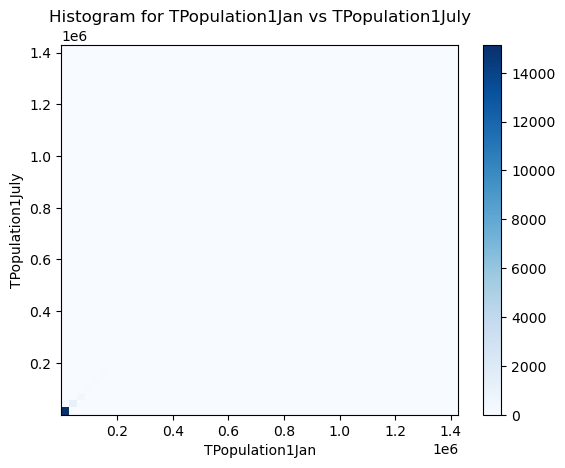

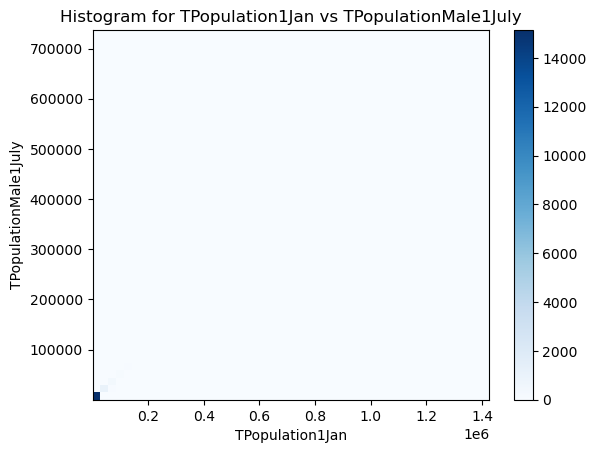

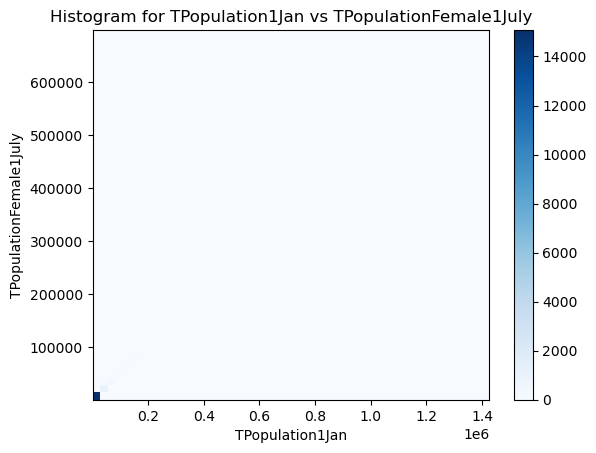

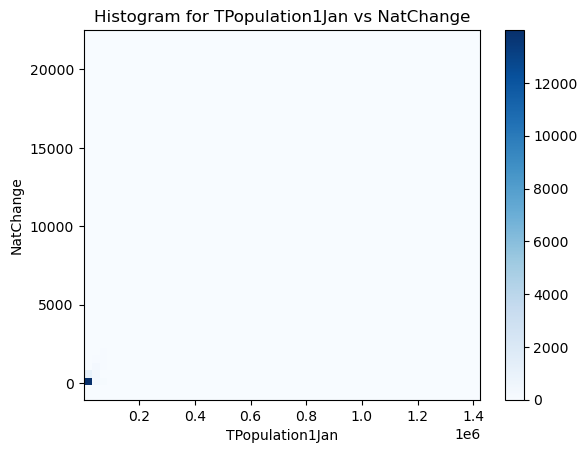

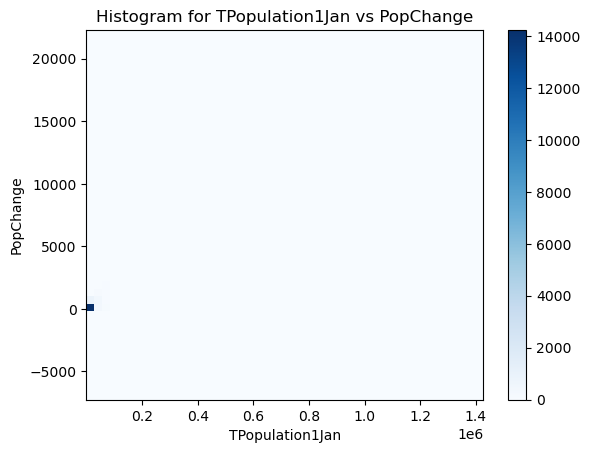

...

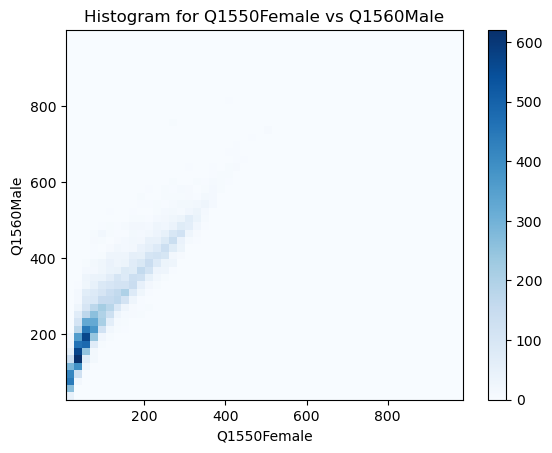

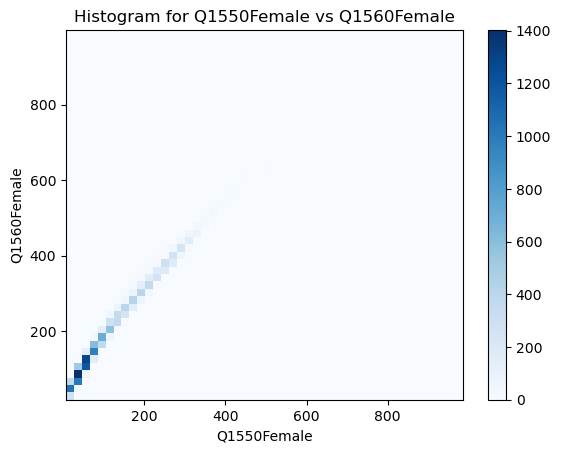

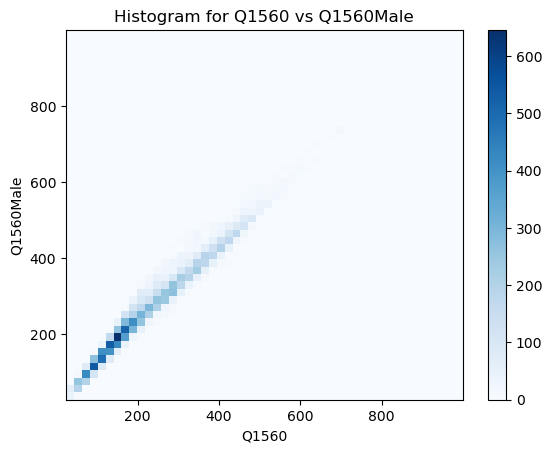

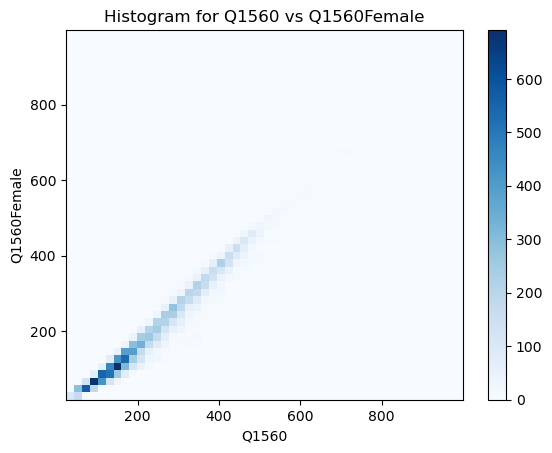

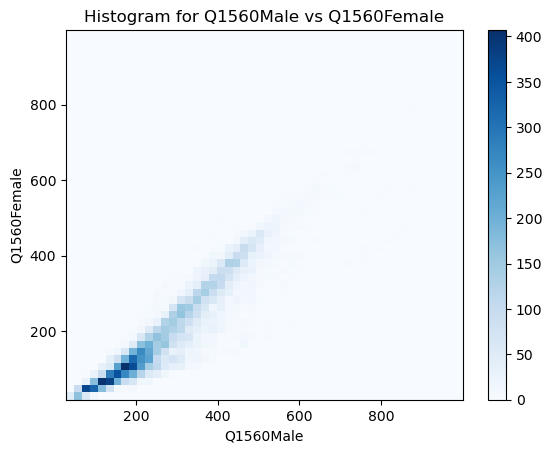

In [11]:
#plotting the most important collinear duplas
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
data = df[numerical_columns]


correlation_threshold = 0.8

# Compute the correlation matrix
correlation_matrix = data.corr().abs()

# Find pairs of features with a correlation coefficient above the threshold
collinear_features = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > correlation_threshold:
            feature_i = correlation_matrix.columns[i]
            feature_j = correlation_matrix.columns[j]
            collinear_features.append((feature_i, feature_j))

# Plot histograms for each pair of collinear features
for feature_i, feature_j in collinear_features:
    plt.figure()
    plt.hist2d(data[feature_i], data[feature_j], bins=50, cmap='Blues')
    plt.xlabel(feature_i)
    plt.ylabel(feature_j)
    plt.colorbar()
    plt.title(f'Histogram for {feature_i} vs {feature_j}')
    plt.show()


## Elimination features based on the correlation coefficient between features, Threshold 0.8

In [12]:
numerical_columns= ['LocID','Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
data = df[numerical_columns]


# Specify the correlation threshold for identifying collinear features
correlation_threshold = 0.8

# Compute the correlation matrix
correlation_matrix = data.corr().abs()

# Create a mask to identify collinear features
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Find pairs of features with a correlation coefficient above the threshold
collinear_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > correlation_threshold:
            feature_i = correlation_matrix.columns[i]
            feature_j = correlation_matrix.columns[j]
            collinear_features.add(feature_j)
            
            
print( collinear_features )            

# Remove the collinear features from the dataset
data_filtered = data.drop(columns=collinear_features)


{'DeathsFemale', 'Q5', 'Q1550Male', 'LExFemale', 'IMR', 'TPopulation1July', 'DeathsMale', 'CNMR', 'Q1560', 'Births1519', 'TPopulationMale1July', 'Q0040', 'NatChange', 'Deaths', 'LE15', 'Under5Deaths', 'LBsurvivingAge1', 'LE15Female', 'LE15Male', 'Q0040Male', 'TFR', 'Q1550Female', 'NRR', 'LE80Male', 'PopChange', 'Q0060Female', 'Births', 'Q0040Female', 'LE80', 'LE80Female', 'Q0060Male', 'LExMale', 'TPopulationFemale1July', 'Q1560Male', 'LE65Male', 'LE65Female', 'Q1550', 'LEx', 'Q0060', 'LE65', 'CBR', 'InfantDeaths', 'NatChangeRT', 'Q1560Female'}


## Conclusion: 
After ananlizing the different algorithms for attribute elimination, I am choosing features elimination based on the correlation coefficient between features. It gives me more insights about the attributes affecting the population size. The final dataset includes Inmigration and most of the categories

### Final dataframe for Modeling

In [13]:
# Remove the collinear features from the dataset
data_filtered = data.drop(columns=collinear_features)

In [15]:
data_filtered.head()

,LocID,Time,TPopulation1Jan,PopDensity,PopSexRatio,MedianAgePop,PopGrowthRate,DoublingTime,MAC,SRB,CDR,NetMigrations
0,108,1950,2229.322,86.8637,91.9472,18.3147,2.200,31.5067,30.995,102.5,23.546,-13.343
1,108,1951,2278.903,88.7571,92.1448,18.0842,2.114,32.7884,30.996,102.5,23.879,-13.217
2,108,1952,2327.593,90.6179,92.3191,17.8744,2.036,34.0446,31.026,102.5,23.815,-13.715
3,108,1953,2375.478,92.4508,92.4880,17.6693,1.969,35.2030,31.030,102.5,23.604,-14.962
4,108,1954,2422.721,94.2874,92.6503,17.4706,1.965,35.2747,31.036,102.5,23.347,-14.599


### Generation of the last dataset for modeling

In [ ]:
# merged_df.to_csv('datasets/population_merged_reduced.csv')